In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_style("whitegrid",{'axes.axisbelow': False,'grid.color': 'w','axes.spines.bottom': False, 'axes.spines.left': False, 'axes.spines.right': False,
 'axes.spines.top': False})
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, widgets, Layout
import plotly.express as px
import plotly.graph_objects as go

from IPython.display import Image

import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import plotly.graph_objects as go

from thefuzz import fuzz
from IPython.display import Image
from ipywidgets import interactive
from collections import defaultdict
import pandas as pd
import os
import sys

import itertools
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, interactive, widgets, Layout
from mpl_chord_diagram import chord_diagram

import pandas as pd
import numpy as np
import seaborn as sns
#sns.set_style("whitegrid",{'axes.axisbelow': False,'grid.color': 'w','axes.spines.bottom': False, 'axes.spines.left': False, 'axes.spines.right': False,
# 'axes.spines.top': False})
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, widgets, Layout, fixed
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import pandas_alive

In [2]:
from functions import *

In [3]:
#data prepping
data2 = pd.read_csv("MIDLOCA_2.1.csv", encoding='unicode_escape')
data2 = data2.mask(data2 == '')
data2["latitude"] = data2["midloc2_ylatitude"]
data2["longitude"] = data2["midloc2_xlongitude"]
data2.sort_values("year", ascending = True, inplace=True)#sorting the disputes based on the years
data2.drop(data2[data2["midloc2_precision"] == -99].index, inplace=True)#removing rows that dont have required information
data2["precision"] = (max(data2["midloc2_precision"]) + 1 - data2["midloc2_precision"])/max(data2["midloc2_precision"])
data3 = pd.read_csv("dyadic_mid_4.02.csv")
data3 = data3[data3['outcome']!=0] 
temp = data3[['disno', 'namea', 'nameb']]
data2 = data2.merge(temp, how='left', left_on='dispnum', right_on='disno')
data2['countries'] = data2['namea'] + ', ' + data2['nameb']
data2.drop_duplicates(subset=['dispnum'], inplace=True)

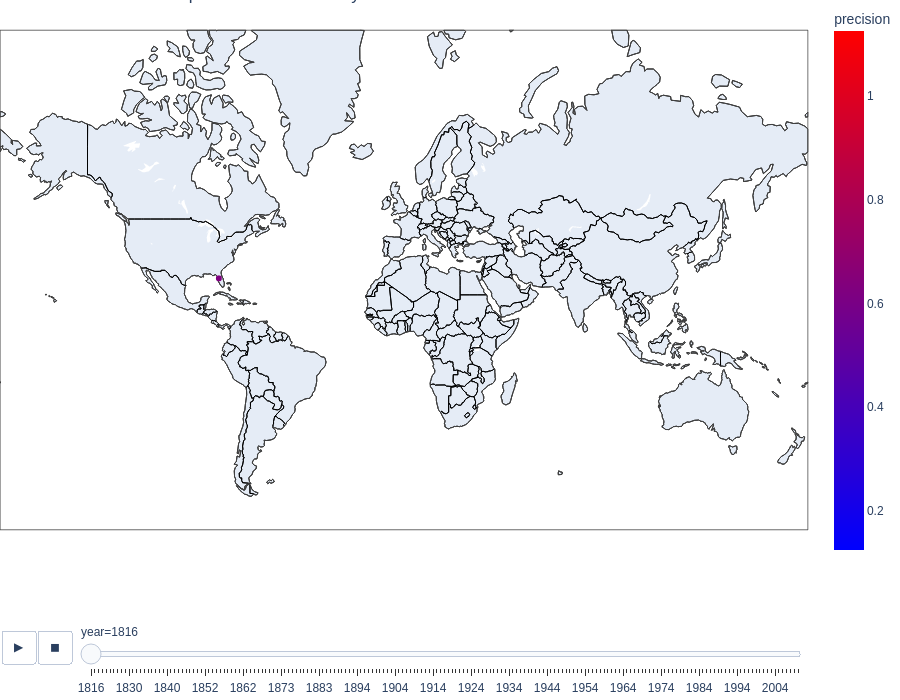

In [4]:
fig = plotLocations(data2)
img_bytes = fig.to_image(format="png")

Image(img_bytes)

In [5]:
# display the interactive map
fig.show()

In [6]:
barByYear = interactive(barTotalDisputesUpto, data=fixed(data3), year = widgets.IntSlider(value=7,
    min=1820,
    max=2010,
    step=5,
    description='Upto Year',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'))

In [7]:
barByYear

interactive(children=(IntSlider(value=1820, continuous_update=False, description='Upto Year', max=2010, min=18…

# 2. Formal Alliances

## An example alliance map

In [8]:
year = 1949
alliance_map = AllianceMap()
alliance_map.connect_countries(year)
alliance_map.label_countries()

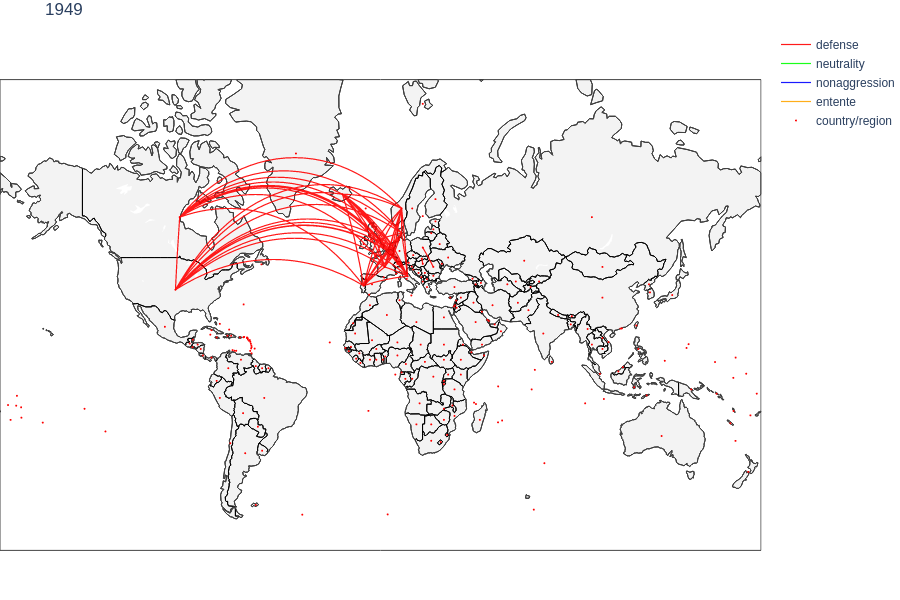

In [9]:
alliance_map.fig.update_geos(
    projection_type="mercator",
    showcountries=True, 
    countrycolor="Black",
    landcolor="rgb(243,243,243)",
    lataxis_range=[-30,86],
)
alliance_map.fig.update_layout(
    title=str(year),
    width=900,
    height=600,
    margin={"r":0,"t":30,"l":0,"b":0},
#     showlegend=False,
)
img_bytes = alliance_map.fig.to_image(format="png")

Image(img_bytes)

In [10]:
# display an interactive map
alliance_map.fig.show()

In [11]:
# optionally save all the figures to images
# for year in range(1816, 2013):
# for year in range(1945, 1952):
#     save_to_img(year)

## Interactive animation map

In [12]:
# create the initial frame for the animation
alliance_map0 = AllianceMap()
alliance_map0.connect_countries(1816)
alliance_map0.label_countries()
initial_data = alliance_map0.fig.data

In [13]:
# create the figures
frames0 = []
for year in range(1816, 2013):
    map_ = AllianceMap()
    map_.connect_countries(year)
    map_.label_countries()
    frames0.append(map_.fig)

In [14]:
# put the figure data into frames
frames = [
    go.Frame(
        data=list(f.data), name=str(year)
    ) for f, year in zip(frames0, range(1816, 2013))
]

In [15]:
# create animation auguments
fig_dict = {
    "data": list(initial_data),
    "layout": {},
    "frames": frames
}
fig_dict["layout"]["hovermode"] = "closest"

# create buttons "Play" and "Pause" for the animation
fig_dict["layout"]["updatemenus"] = [
    {
        "buttons": [
            {
                "args": [
                    None, 
                    {
                        "frame": {"duration": 500, "redraw": True},
                        "fromcurrent": True, 
                        "transition": {"duration": 300, "easing": "quadratic-in-out"}
                    }
                ],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [
                    [None], 
                    {
                        "frame": {"duration": 0, "redraw": False},
                        "mode": "immediate",
                        "transition": {"duration": 0}
                    }
                ],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 3},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }
]

# create sliders for the animation
sliders_dict = {
    "active": 0,
    "yanchor": "top",
    "xanchor": "left",
    "currentvalue": {
        "font": {"size": 20},
        "prefix": "Year:",
        "visible": True,
        "xanchor": "right"
    },
    "transition": {"duration": 300, "easing": "cubic-in-out"},
    "pad": {"b": 10, "t": 0},
    "len": 0.9,
    "x": 0.1,
    "y": 0,
    "steps": []
}

for year in range(1816, 2013):
    slider_step = {
        "args": [
            [str(year)],
            {
                "frame": {"duration": 300, "redraw": True},
                "mode": "immediate",
                "transition": {"duration": 300}
            }
        ],
        "label": str(year),
        "method": "animate"
    }
    sliders_dict["steps"].append(slider_step)

fig_dict["layout"]["sliders"] = [sliders_dict]

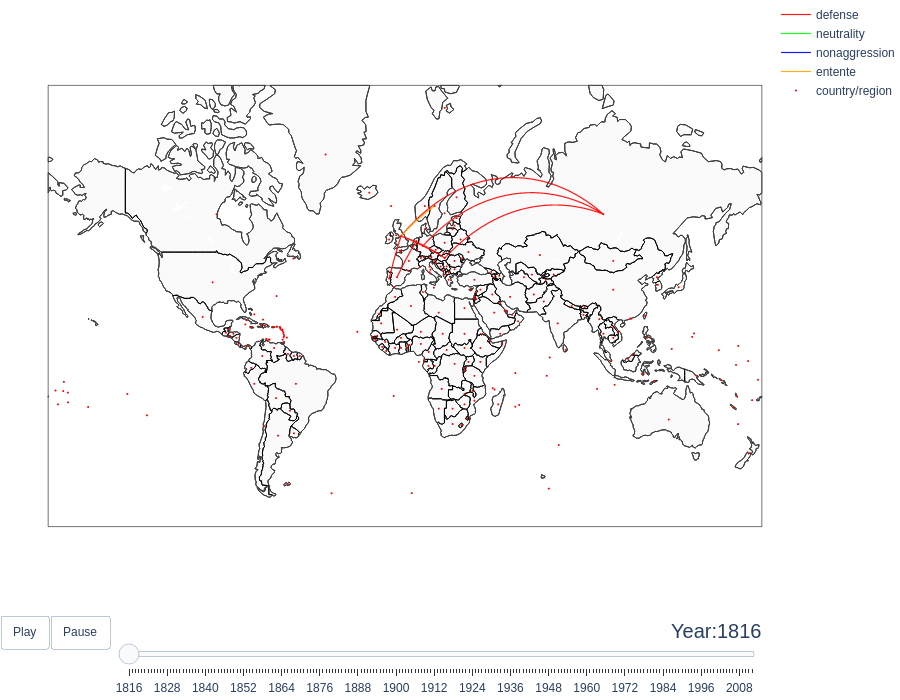

In [16]:
# make animations
fig = go.Figure(
    fig_dict
)

fig.update_geos(
    projection_type="mercator",
    showcountries=True, 
    countrycolor="Black",
    landcolor="rgb(250,250,250)",
    lataxis_range=[-30,86],
)
fig.update_layout(
    width=900,
    height=700, 
    margin={"r":0,"t":0,"l":0,"b":0},
#     showlegend=False,
)

img_bytes = fig.to_image(format="png")
#from IPython.display import Image
Image(img_bytes)

In [17]:
# display an interactive map
fig.show()

# 3. Diplomatic Exchanges

In [18]:

sys.path = [os.path.abspath("..")] + sys.path
data = pd.read_csv('COW-country-codes.csv', sep=",")
data = data.values.tolist()

years=set()
data1 = pd.read_csv('Diplomatic_Exchange_2006v1.csv', sep=",")
data1 = data1.values.tolist()
for idx in range(len(data1)):
    years.add(int(data1[idx][2]))
years=sorted(list(years))


In [19]:
name=['United States of America',
    'United Kingdom',
    'France',
    'Netherlands',
    'Belgium',
    'Luxembourg',
    'Canada',
    'Denmark',
    'Norway',
    'Iceland',
    'Portugal',
    'Italy'
]
nato=[2,200,220,210,211,212,20,390,385,395,235,325]
name_to_code=defaultdict(int)
all_name=[]
all_coun_code=[]
for idx in range(len(data)):
    name_to_code[data[idx][2]]=data[idx][1]
    if data[idx][0] not in all_coun_code:
        all_coun_code.append(data[idx][1])
    if data[idx][1] not in all_name:
        all_name.append(data[idx][2])
all_name=list(set(all_name))

In [20]:
myy = interactive(sankey_new, data=fixed(data),name_to_code=fixed(name_to_code),
    year = widgets.IntSlider(min = 1920, max = 2000, step = 10, value = 1920),
    
    coun_list= widgets.SelectMultiple(
        options=all_name,
        value=[ 'United States of America',
                'United Kingdom',
                'France',
                'Netherlands',
                'Belgium',
                'Luxembourg',
                'Canada',
                'Denmark',
                'Norway',
                'Iceland',
                'Portugal',
                'Italy'
            ],
        description='countries',
        disabled=False
    )

    )
myy

interactive(children=(IntSlider(value=1920, description='year', max=2000, min=1920, step=10), SelectMultiple(d…

# 4. National Import Export

-- Jacob Ayers --
<br>
_October_2022_
<br>
Lightly modified for the Correlates of War project's Trade (v4.0) dataset

##  Data Import

In [21]:
data = pd.read_csv("National_Import_Export.csv")

##  Code

In [22]:
mapByYear = interactive(mapImportExportByYear,data=fixed(data), 
                        year = widgets.IntSlider(min = 1870, max = 2014, step = 1, value = 10),
                        category=widgets.Dropdown(options=["imports","exports","net(exports-imports)","imports_yearly_difference","exports_yearly_difference"],value="imports",description="Display Info: ",disabled=False),
                        normalization=widgets.Dropdown(options=[False,True],value=False,description="Normalization",disabled=False))

##  Visualization

In [23]:
mapByYear

interactive(children=(IntSlider(value=1870, description='year', max=2014, min=1870), Dropdown(description='Dis…

# Line Graphs

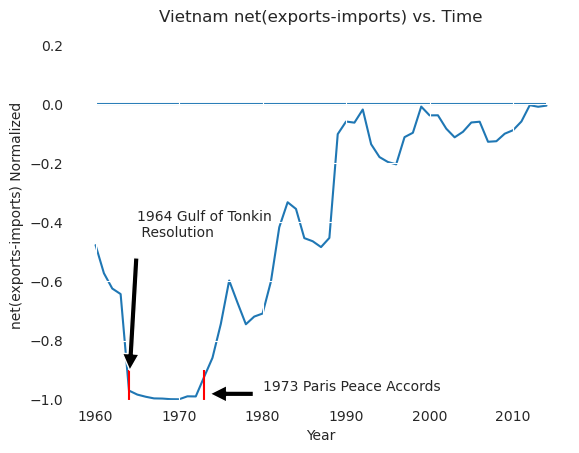

In [24]:
line_graph_vietnam(data)

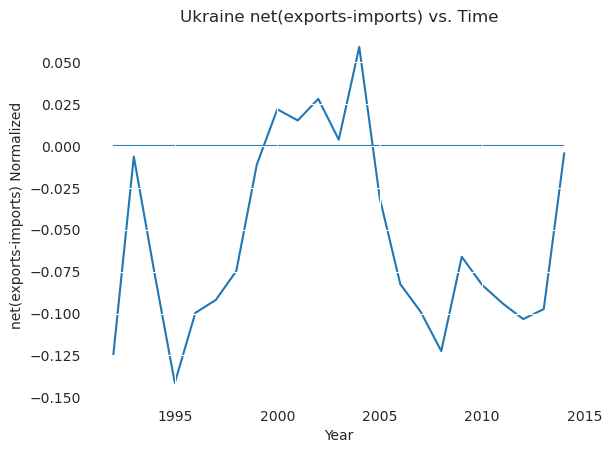

In [25]:
line_graph_ukraine(data)

# 5. National Material Capabilities

National Material Capabilities dataset (v6.0, annual values from 1816-2016)<br>
6 most widely used indicators: <br>
  military expenditure, military personnel, energy consumption, iron and steel production, urban population, and total population<br>
ps: CINC index is based on these six variables. 


In [26]:
data=pd.read_csv("NMC-60-abridged.csv")
data

,stateabb,ccode,year,milex,milper,irst,pec,tpop,upop,cinc,version
0,USA,2,1816,3823,17,80,254,8659.0,101.0,0.039697,2021
1,USA,2,1817,2466,15,80,277,8899.0,106.0,0.035817,2021
2,USA,2,1818,1910,14,90,302,9139.0,112.0,0.036127,2021
3,USA,2,1819,2301,13,90,293,9379.0,118.0,0.037133,2021
4,USA,2,1820,1556,15,110,303,9618.0,124.0,0.037087,2021
...,...,...,...,...,...,...,...,...,...,...,...
15946,WSM,990,2012,0,0,0,36,189.0,0.0,0.000005,2021
15947,WSM,990,2013,0,0,0,36,191.0,0.0,0.000005,2021
15948,WSM,990,2014,-9,0,0,37,192.0,0.0,0.000006,2021
15949,WSM,990,2015,0,0,0,38,194.0,0.0,0.000005,2021


In [27]:
#check if na
data.isnull().sum()

stateabb    0
ccode       0
year        0
milex       0
milper      0
irst        0
pec         0
tpop        0
upop        0
cinc        0
version     0
dtype: int64

In [28]:
data.dtypes

stateabb     object
ccode         int64
year          int64
milex         int64
milper        int64
irst          int64
pec           int64
tpop        float64
upop        float64
cinc        float64
version       int64
dtype: object

In [29]:
#Look into 6 most powerful countries based on CINC of year 2016
df_2016=data[data['year']==2016] 
top_con=df_2016.nlargest(6, ['cinc'])
top_con

,stateabb,ccode,year,milex,milper,irst,pec,tpop,upop,cinc,version
13773,CHN,710,2016,145039000,2333,807609,5679028,1403500.0,526464.0,0.230618,2021
200,USA,2,2016,604452000,1381,78475,3293117,322180.0,197817.0,0.133058,2021
14314,IND,750,2016,51052000,1346,95477,1641825,1324171.0,251579.0,0.086841,2021
8143,RUS,365,2016,46626000,798,70453,1322198,143965.0,56926.0,0.036473,2021
14244,JPN,740,2016,47342000,247,104775,716148,127749.0,92655.0,0.032967,2021
14093,ROK,732,2016,33778000,628,68576,474449,50792.0,34203.0,0.023262,2021


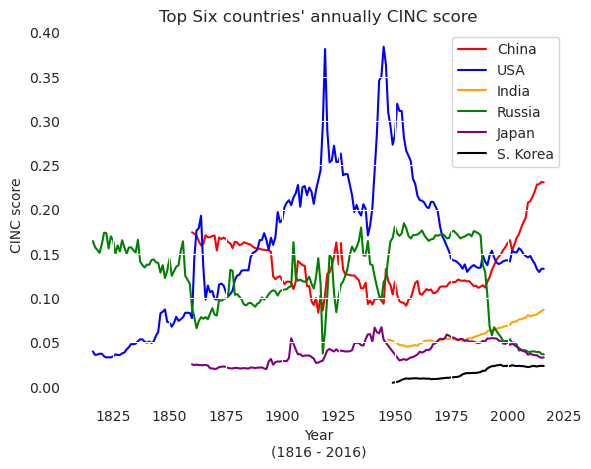

In [30]:
top_cinc_score_countries(data)

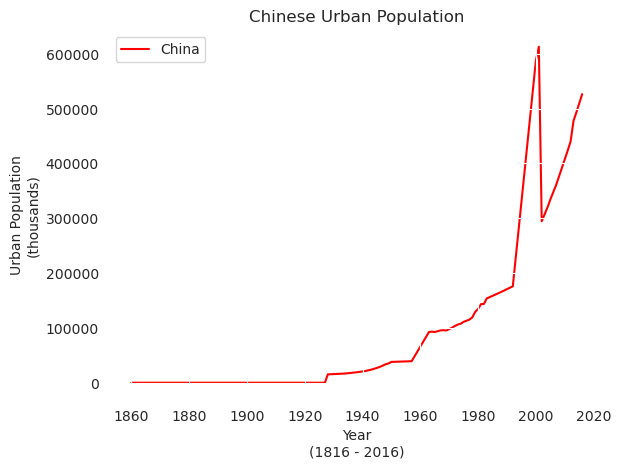

In [31]:
chinese_urban_population(data)